# S&P 500 Simulator with Cellular Automata

The project aims to investigate how cellular automata and neural networks can be used together and what insights can be gained from their intersection. The purpose is not to create a perfect stock market simulator or a highly complex cellular automata model but to explore the relationship between these two fields and their applications.

By combining these two fields, the project seeks to contribute to the ongoing exploration of how artificial intelligence and machine learning can be used to create models that can assist with decision-making processes. Cellular automata models and neural networks have shown potential in various fields, such as predicting weather patterns, modeling the spread of diseases, and simulating social systems. 

The intersection of cellular automata and neural networks is a promising field of research that can lead to novel insights, technology advancements, and real-world applications. Combining these two fields can provide new computational tools to model complex systems and improve their accuracy and reliability. Additionally, studying the intersection of cellular automata and neural networks can foster cross-disciplinary collaborations, leading to new collaborations and research that can advance scientific understanding. As such, this area of research has significant potential to contribute to various fields such as finance, biology, physics, and social sciences.

### Motivation
The stock market is a complex system, and predicting its behavior is an arduous task. Traditional methods of modeling stock price movements, such as stochastic processes and regression, have limitations in capturing the non-linear and non-stationary dynamics of the market. One possible solution is to use a cellular automaton approach. Cellular automata (CA) is a discrete model of computation that captures complex systems with simple rules. CA models have been used to model physical, biological, and social phenomena. Here, we propose a novel approach to model stock price movements using Cellular Automata and LSTM.

### Background:
A cellular automaton is a grid of cells, where each cell can be in a finite number of states. In our case, each cell represents a stock, and the state of a stock is its intraday price change. The rules of a CA define how the state of a cell evolves over time, based on the states of its neighboring cells. Using a CA, we can simulate the collective behavior of stocks in the market.

Long Short-Term Memory (LSTM) is a type of Recurrent Neural Network (RNN) that can model the sequence data. LSTM is capable of learning long-term dependencies in sequential data, which is essential in capturing the non-linear dynamics of the stock market. LSTM can take in the intraday price changes of a stock as input and predict the change in the stock price at the next time step.

### Implementation:
We start by loading the grid of stocks, which is a 2D array where each cell represents a stock. We use the SP500 dataset, which contains the daily change percentages for 500 stocks. We then create a set of rules that define how the state of a cell changes over time based on the intraday price changes of its neighboring cells. To create these rules, we train an LSTM model on the historical data of each stock and its neighbors. We use the trained LSTM models to predict the intraday price change of a stock at the next time step, based on the intraday price changes of its neighbors. We update the state of each cell using the predicted intraday price changes. We repeat this process for each time step to simulate the behavior of the stock market over time.

To summarize, the proposed approach uses Cellular Automata to model the collective behavior of stocks in the market and LSTM to predict the intraday price changes of each stock based on the intraday price changes of its neighbors. The proposed approach has the potential to capture the non-linear and non-stationary dynamics of the stock market and can be used to simulate the behavior of the stock market over time.

## Grid Placement Strategy

Grid placement is crucial in this project because the cellular automaton's behavior is heavily influenced by the initial conditions and spatial relationships between stocks. A well-designed grid placement strategy ensures that the relationships between stocks are accurately represented, leading to a more realistic simulation of the S&P 500 index. By accounting for factors such as stock correlations and market capitalization, the grid placement can better capture the interconnectedness of stocks, which is essential for modeling the S&P 500.

### Types of Grid Placement Strategies

#### Random placement

Stocks are placed randomly on the grid without considering any underlying relationships between them. This approach is simple to implement but may not capture the complex interdependencies between stocks.

#### Clustering-based placement

Stocks are grouped based on their historical correlations or other similarity measures, and each cluster is placed on the grid. This approach better captures the relationships between stocks, but it may not fully utilize the grid's spatial dimensions.

#### Force-directed graph layout

Stocks are modeled as nodes in a weighted graph, with edges representing correlations between stocks. A force-directed layout algorithm, such as the Fruchterman-Reingold algorithm, is then used to optimize the positions of the stocks on the grid. This approach provides a visually appealing and well-balanced representation of the relationships between stocks.

#### Hybrid approaches

Combining various techniques, such as clustering and force-directed graph layout, can provide a more sophisticated grid placement that accounts for multiple factors, such as stock correlations and market capitalization.

The pipeline for achieving the desired grid placement consists of the following steps:

1. **Data preprocessing**: Calculate the daily percentage change of stock prices for all S&P 500 stocks and compute a correlation matrix based on this data.
2. **Clustering**: Perform hierarchical clustering on the correlation matrix using a suitable linkage method, such as Ward's method, which tends to create evenly sized clusters. Cut the dendrogram at an optimal number of clusters, determined by analyzing the relationship between the number of clusters and a combined score of cluster quality and size distribution.
3. **Market capitalization weighting**: Assign weights to stocks based on their market capitalization. This step ensures that larger-cap stocks have a greater influence on the grid placement, reflecting their importance in the S&P 500 index.
4. **Force-directed graph layout**: Create a weighted graph with stocks as nodes and correlations as edge weights. Apply a force-directed layout algorithm to optimize the positions of stocks on the grid, taking into account their cluster assignments and market capitalization weights.
5. **Grid assignment**: Map the stocks' positions on the grid, ensuring that each cell contains only one stock. This step may require resolving conflicts where multiple stocks are assigned to the same cell by adjusting their positions iteratively.

### Data Preprocessing

- The Daily Change data is generated and saved to `sp500_daily_change.csv` with the column names being the stock tickers and the index being the date.
- The Correlation Matrix is generated and saved to `sp500_correlation_matrix.csv` with the column names and index being the stock tickers.
- The Market Capitalization data is loaded from `sp500_market_caps.json` with the keys being the stock tickers and the values being the market capitalization.

In [1]:
%matplotlib widget

In [2]:
import json

import pandas as pd

In [3]:
daily_change_df = pd.read_csv("sp500_daily_change.csv", index_col=0)
correlation_matrix = pd.read_csv("sp500_correlation_matrix.csv", index_col=0)

with open("sp500_market_caps.json", "r") as f:
    market_caps = json.load(f)

#### Filtering

The _S&P 500_ has 503 stocks, which is an odd number and hard (or impossible) to place on an evenly sized grid. Therefore, we will remove 3 of the smallest stocks to make the grid a nice round number (500 = 20 * 25).

In [4]:
smallest_stocks = sorted(market_caps, key=market_caps.get)[:3]
print("Removing the following stocks from the dataset to leave a nice round number of 500: ", smallest_stocks)

daily_change_df.drop(columns=smallest_stocks, inplace=True)
correlation_matrix.drop(index=smallest_stocks, columns=smallest_stocks, inplace=True)

for stock in smallest_stocks:
    del market_caps[stock]

Removing the following stocks from the dataset to leave a nice round number of 500:  ['FRC', 'LNC', 'DISH']


#### Visualize the Correlation Matrix

The correlation matrix is a symmetric matrix with 1s on the diagonal.
The values in the matrix represent the correlation between the stocks.
The higher the value, the more correlated the stocks are.
The lower the value, the less correlated the stocks are.

The following plot shows the correlation matrix as a heatmap.
It helps visualize the correlation between the 500 stocks.
It also reveals the complex nature and task of placing the stocks on a grid.

In [5]:
import plotly.graph_objects as go

In [6]:
fig = go.Figure(
    data=go.Heatmap(
        z=correlation_matrix.values,
        x=list(correlation_matrix.columns),
        y=list(correlation_matrix.index),
        colorscale="Viridis",
        showscale=True,
    )
)

fig.show()

### Hierarchical Clustering

The first step is to perform hierarchical clustering on the correlation matrix.
The result is a dendrogram, which is a tree diagram that shows the hierarchical relationship between the stocks.

#### What is hierarchical clustering?

Hierarchical clustering is a method of cluster analysis that builds a hierarchy of clusters.
It begins with each stock in its own cluster.
Then, it repeatedly merges the two most similar clusters until only one cluster remains.

#### What is a dendrogram?

A dendrogram is a tree diagram that shows the hierarchical relationship between objects.
It can be used to visualize the clusters at a given level of granularity.

#### Steps to compute the dendrogram from the correlation matrix

1. Calculate the distance matrix from the correlation matrix.

This is done by subtracting the absolute correlation matrix from 1.
Then `scipy.spatial.distance.squareform` is used to convert the matrix to a condensed distance matrix.
This is a 1D array containing the upper triangular of the distance matrix.
This is the format required by `scipy.cluster.hierarchy.linkage`.


2. Perform hierarchical clustering on the distance matrix.

Then, `scipy.cluster.hierarchy.linkage` is used to perform hierarchical clustering on the distance matrix.
We use the `ward` method, which is the Ward variance minimization algorithm.
It minimizes the sum of squared differences within all clusters.
It is a variance-minimizing approach and, in that sense, is similar to the k-means algorithm.
It tries to find clusters that are more compact and homogeneous compared to other clustering methods.

The result is a linkage matrix, which is a matrix that encodes the hierarchical clustering.
It is a 2D array with 4 columns and `n - 1` rows, where `n` is the number of stocks.
Each row represents a merge: `[stock1, stock2, distance, number of stocks in the cluster]`.

In [7]:
from scipy.cluster.hierarchy import linkage
from scipy.spatial.distance import squareform

In [8]:
distances = squareform(1 - correlation_matrix.abs())
linkage_matrix = linkage(distances, method='ward')

#### Visualize the dendrogram of the linkage matrix.

Note: Considering there are 500 stocks, the dendrogram is very large and hard to visualize. However, it can help reveal the hierarchical relationship between the stocks.

In [9]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

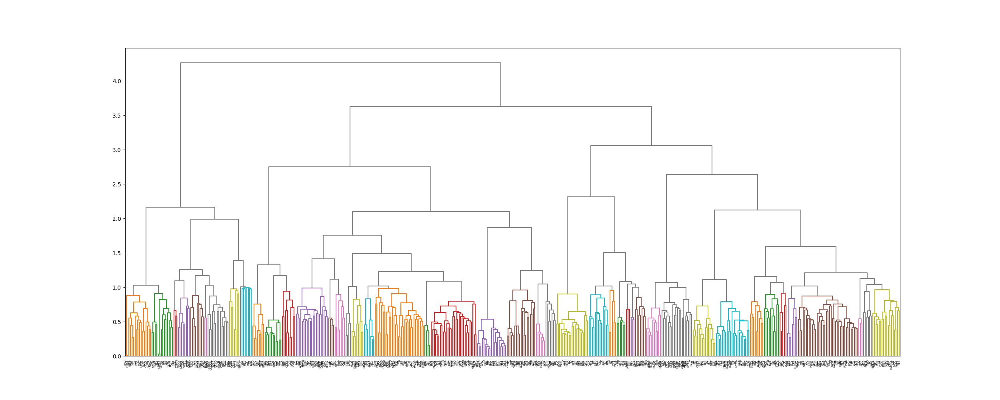

In [10]:
fig = plt.figure(figsize=(25, 10))
sp500_dn = dendrogram(linkage_matrix, labels=correlation_matrix.index, orientation='top', color_threshold=1, above_threshold_color='grey')
plt.show()

### Clustering Evaluation

To form the clusters, we cut the dendrogram at a given distance.
This is done by using `scipy.cluster.hierarchy.fcluster` to extract the clusters from the linkage matrix.
The `criterion` parameter is set to `maxclust` to specify the maximum number of clusters through the `t` parameter.

#### Calculating the best `t` value using sklearn's Silhouette Score

The Silhouette Score is a measure of how similar an object is to its own cluster compared to other clusters.
The score ranges from -1 to 1.
The higher the score, the better the clustering.

We will test different values of `t` between 5 and 20 and calculate the Silhouette Score for each value.
The value of `t` with the highest Silhouette Score will be used to cut the dendrogram.

In [11]:
import numpy as np
from scipy.cluster.hierarchy import fcluster, linkage
from scipy.stats import variation
from sklearn.metrics import silhouette_score

Best t: 16, with combined score: 0.02205576907292602


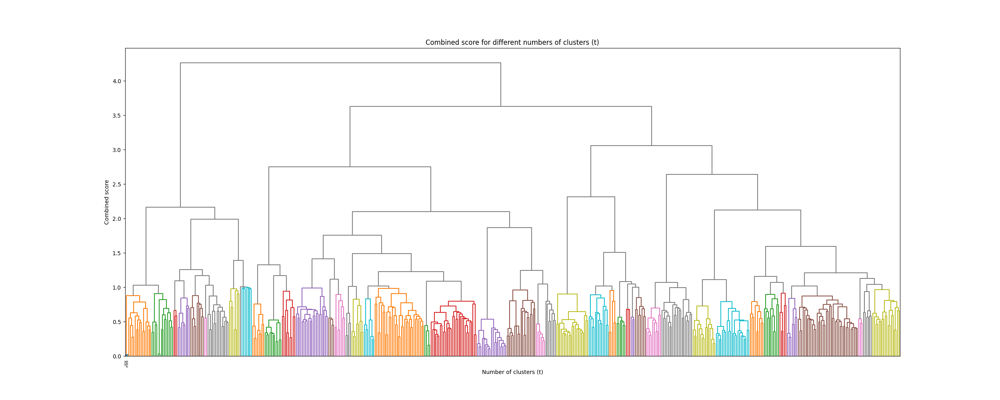

In [12]:
min_t = 5
max_t = 21  # 20 but we want to include 20 in the range so we add 1

# Convert the correlation matrix to a distance matrix
distance_matrix = 1 - correlation_matrix.abs()
np.fill_diagonal(distance_matrix.values, 0)

def combined_metric(distance_matrix, clusters):
    silhouette_avg = silhouette_score(distance_matrix, clusters, metric='precomputed')
    cluster_sizes = np.bincount(clusters)
    cv = variation(cluster_sizes)
    
    return silhouette_avg * (1 - cv)

best_t = 5
best_score = -1
scores = []

for t in range(min_t, max_t):
    clusters = fcluster(linkage_matrix, t=t, criterion='maxclust')
    combined_score = combined_metric(distance_matrix, clusters)
    scores.append(combined_score)
    
    if combined_score > best_score:
        best_score = combined_score
        best_t = t

print(f"Best t: {best_t}, with combined score: {best_score}")

# Plot the combined scores
plt.plot(range(min_t, max_t), scores)
plt.xticks(range(min_t, max_t))
plt.xlabel('Number of clusters (t)')
plt.ylabel('Combined score')
plt.title('Combined score for different numbers of clusters (t)')
plt.show()

In [13]:
clusters = fcluster(linkage_matrix, t=best_t, criterion="maxclust")

# Create a DataFrame containing stock symbol, cluster number, and market cap

cluster_df = pd.DataFrame(
    {
        "symbol": list(market_caps.keys()),
        "cluster": clusters,
        "market_cap": list(market_caps.values()),
    }
)

# Calculate the mean of market caps within each cluster and sort the clusters based on the mean
cluster_mean_df = (
    cluster_df.groupby("cluster")
    .agg({"market_cap": "mean"})
    .sort_values(by="market_cap", ascending=False)
    .reset_index()
)

# Assign new cluster numbers based on the sorted order
cluster_mean_df["new_cluster"] = range(1, len(cluster_mean_df) + 1)

# Ensure both 'cluster' columns are of the same data type
cluster_df["cluster"] = cluster_df["cluster"].astype(int)
cluster_mean_df["cluster"] = cluster_mean_df["cluster"].astype(int)

# Create a dictionary with the old and new cluster numbers
cluster_map = dict(zip(cluster_mean_df["cluster"], cluster_mean_df["new_cluster"]))

# Update the cluster numbers in the cluster_df dataframe
cluster_df["cluster"] = cluster_df["cluster"].map(cluster_map)

# Sort the DataFrame based on cluster number and market cap in descending order
sorted_cluster_df = cluster_df.sort_values(
    by=["cluster", "market_cap"], ascending=[True, False]
)


In [14]:
unique_clusters = np.unique(clusters)
cluster_sizes = []

for cluster_id in unique_clusters:
    cluster_stocks = list(correlation_matrix.index[clusters == cluster_id])
    cluster_size = len(cluster_stocks)
    cluster_sizes.append(cluster_size)
    print(f"Cluster {cluster_id} contains the following {cluster_size} tickers:")
    print(cluster_stocks)
    print()

# Print cluster statistics
print(f"Total number of clusters: {len(unique_clusters)}")
print(f"Minimum number of stocks per cluster: {min(cluster_sizes)}")
print(f"Maximum number of stocks per cluster: {max(cluster_sizes)}")
print(f"Average number of stocks per cluster: {np.mean(cluster_sizes):.2f}")
print(f"Median number of stocks per cluster: {np.median(cluster_sizes)}")
print(f"Standard deviation of the number of stocks per cluster: {np.std(cluster_sizes):.2f}")

Cluster 1 contains the following 31 tickers:
['AAL', 'ALLE', 'AMCR', 'APTV', 'CDW', 'CFG', 'CTVA', 'CZR', 'DOW', 'DXC', 'FLT', 'FOX', 'FOXA', 'FTV', 'GM', 'HII', 'HLT', 'HPE', 'HWM', 'INVH', 'IR', 'LIN', 'LW', 'LYB', 'NCLH', 'NWS', 'NWSA', 'SYF', 'VICI', 'WRK', 'XYL']

Cluster 2 contains the following 36 tickers:
['ABBV', 'ANET', 'ATVI', 'AVGO', 'BF-B', 'CBOE', 'CDAY', 'CHTR', 'CTLT', 'EA', 'ENPH', 'EPAM', 'ETSY', 'FTNT', 'GNRC', 'GOOG', 'GOOGL', 'IQV', 'KEYS', 'META', 'MNST', 'MPWR', 'MTCH', 'NOW', 'NXPI', 'ON', 'PAYC', 'PTC', 'PYPL', 'QRVO', 'SEDG', 'SWKS', 'TSLA', 'TTWO', 'VRSK', 'ZTS']

Cluster 3 contains the following 15 tickers:
['AVB', 'CARR', 'CEG', 'DD', 'DE', 'FITB', 'GEHC', 'HST', 'MRNA', 'NUE', 'OGN', 'OTIS', 'PXD', 'VTRS', 'WBD']

Cluster 4 contains the following 28 tickers:
['ADM', 'APA', 'BG', 'BKR', 'CF', 'COP', 'CTRA', 'CVX', 'DVN', 'EOG', 'EQT', 'FANG', 'FCX', 'HAL', 'HES', 'KMI', 'MOS', 'MPC', 'MRO', 'NEM', 'NRG', 'OKE', 'OXY', 'PSX', 'SLB', 'TRGP', 'VLO', 'XOM']

Cl

This clustering algorithm works almost too perfectly.
While the clustering algorithm was only provided data derived from just intraday performance, it does an excellent job to group together stocks not just with similar performance, but also industries and sectors together.
While it is assumed that stocks in the same sector perform similarly, this clustering algorithm confirms this assumption in an unbiased manner.

Here are some examples demonstrating how good the clusters are:
- Cluster 7 includes exclusively travel related stocks: from airlines (AAL, ALK, and DAL) to cruises (CCL and RCL) and even hotels (MAR, MGM, and WYNN) to booking sites (BKNG and EXPE).
- Cluster 13 includes a lot of tech stocks from AAPL, ADBE, MSFT , and NVD to older tech companies like IBM, INTC, MU, ORCL, and TXN.
- Cluster 14 includes most of the banking and financial stocks from large banks like JPM, C, BAC, and WFC to regional banks like RF, RJF, and ZION.

Overall, the clusters are very good and the algorithm does an excellent job to group together stocks with similar performance, industries, and sectors.

### Market Capitalization Weighting


We are choosing Market Capitalization as the weights for the stocks.
Because we are analyzing an Index (S&P 500), we want to give more weight to the larger stocks as they have a larger impact on the index's performance.

In [15]:
market_caps_series = pd.Series(market_caps)
weights = market_caps_series / market_caps_series.sum()

#### Create Force-Directed Graph Layout

The next step is to create a force-directed graph layout.
This is done by using `networkx` to create a graph and create the layout using `networkx.spring_layout`.

In [16]:
import networkx as nx

In [17]:
G = nx.Graph()

for i, stock in enumerate(correlation_matrix.columns):
    G.add_node(stock, cluster=clusters[i], weight=weights[i])

for i, stock1 in enumerate(correlation_matrix.columns):
    for j, stock2 in enumerate(correlation_matrix.columns):
        if i < j:
            G.add_edge(
                stock1, stock2, weight=1 - correlation_matrix.loc[stock1, stock2]
            )

pos = nx.spring_layout(G, seed=42, weight="weight", k=0.5, iterations=100)

#### Placement Evaluation Algorithm

The `evaluate_placement` function is designed to evaluate the quality of a given grid placement by considering the spatial distribution of stocks with respect to their market capitalization. The idea is that stocks with larger market capitalization should be closer to the center of the grid, as they have a more significant impact on the overall index behavior.

The function takes two inputs: the grid, which is the 2D placement of stocks in the form of a list of lists, and the `sorted_cluster_df`, which is a DataFrame containing stock symbols and their corresponding market capitalization.

The function follows these steps:

1. Determine the `grid_size` and `grid_center`: The dimensions of the grid are calculated, and the center point of the grid is determined.
2. Create a `market_cap_lookup` dictionary: This dictionary maps stock symbols to their market capitalization, facilitating quick lookups in the following steps.
3. Calculate the `max_market_cap`: The maximum market capitalization value is calculated to normalize market capitalization weights in the scoring process.


Initialize the `total_score` variable: This variable accumulates the score calculated for each stock in the grid.

Iterate through the `grid` cells: For each cell in the grid (i, j), perform the following steps:

1. If the grid cell contains a stock, extract the stock symbol and cluster ID.
2. Get the market capitalization of the stock from the market_cap_lookup dictionary.
3. Calculate the market_cap_weight by dividing the market capitalization of the stock by the max_market_cap. This normalization ensures that the weight is between 0 and 1.
4. Compute the distance_from_center as the Manhattan distance between the grid cell (i, j) and the grid_center. The Manhattan distance is used because it represents the shortest path between two points on a grid when movement is restricted to horizontal and vertical directions.
5. Update the total_score by adding the product of the market_cap_weight and the distance_from_center. This step assigns higher scores to stocks with larger market capitalization that are further away from the center.

Return the `total_score`: After iterating through all grid cells, the function returns the accumulated total score as a measure of the grid placement quality.

In summary, the `evaluate_placement` function assesses the quality of a grid placement by considering the spatial distribution of stocks based on their market capitalization.
Stocks with larger market capitalization are expected to be closer to the center of the grid.
The function calculates a score that represents how well the placement adheres to this expectation, with lower scores indicating better placements.

In [18]:
def evaluate_placement(grid, sorted_cluster_df):
    grid_size = (len(grid), len(grid[0]))
    grid_center = (grid_size[0] // 2, grid_size[1] // 2)

    market_cap_lookup = dict(zip(sorted_cluster_df["symbol"], sorted_cluster_df["market_cap"]))
    max_market_cap = sorted_cluster_df["market_cap"].max()

    total_score = 0
    for i in range(grid_size[0]):
        for j in range(grid_size[1]):
            if grid[i][j] is not None:
                stock, cluster = grid[i][j]
                market_cap = market_cap_lookup[stock]
                market_cap_weight = market_cap / max_market_cap
                distance_from_center = abs(grid_center[0] - i) + abs(grid_center[1] - j)
                total_score += market_cap_weight * distance_from_center

    return total_score

##### Placement Strategy

The `get_best_placement` function aims to find the best grid placement for the stocks in the S&P 500 index based on their market capitalization and cluster membership. 
It does this by iteratively generating random placements and selecting the one with the lowest score as determined by the `evaluate_placement` function.

In [19]:
def get_best_placement(sorted_cluster_df, iterations=10000):
    best_grid = None
    best_score = float('inf')

    for _ in range(iterations):
        grid = [[None for _ in range(25)] for _ in range(20)]

        for cluster in sorted_cluster_df['cluster'].unique():
            place_cluster(grid, sorted_cluster_df, cluster)

        score = evaluate_placement(grid, sorted_cluster_df)

        if score < best_score:
            best_score = score
            best_grid = grid

    return best_grid, best_score

In [20]:
from grid import place_cluster

In [21]:
# Place the stocks in a grid
grid_positions = np.array([(i // 25, i % 25) for i in range(500)])
pos_df = pd.DataFrame(pos).T
pos_df["grid_x"] = pd.cut(
    pos_df[0], bins=np.linspace(0, 1, 21), labels=False, include_lowest=True
)
pos_df["grid_y"] = pd.cut(
    pos_df[1], bins=np.linspace(0, 1, 26), labels=False, include_lowest=True
)

# Check for NaN values and replace them with appropriate indices
pos_df.loc[pos_df["grid_x"].isna(), "grid_x"] = 0
pos_df.loc[pos_df["grid_y"].isna(), "grid_y"] = 0

# Convert 'grid_x' and 'grid_y' columns to integers using applymap()
pos_df = pos_df.applymap(lambda x: int(x))

# Find the best placement
# NOTE: For the demo, we'll use a small number of iterations; you may want to increase this value
best_grid, best_score = get_best_placement(sorted_cluster_df, iterations=100)
print(f"Best placement evaluation score: {best_score}")

# Convert the grid to a DataFrame and save it to a CSV file
grid_df = pd.DataFrame(best_grid)

Best placement evaluation score: 132.83708147893753


In [22]:
from grid import plot_grid

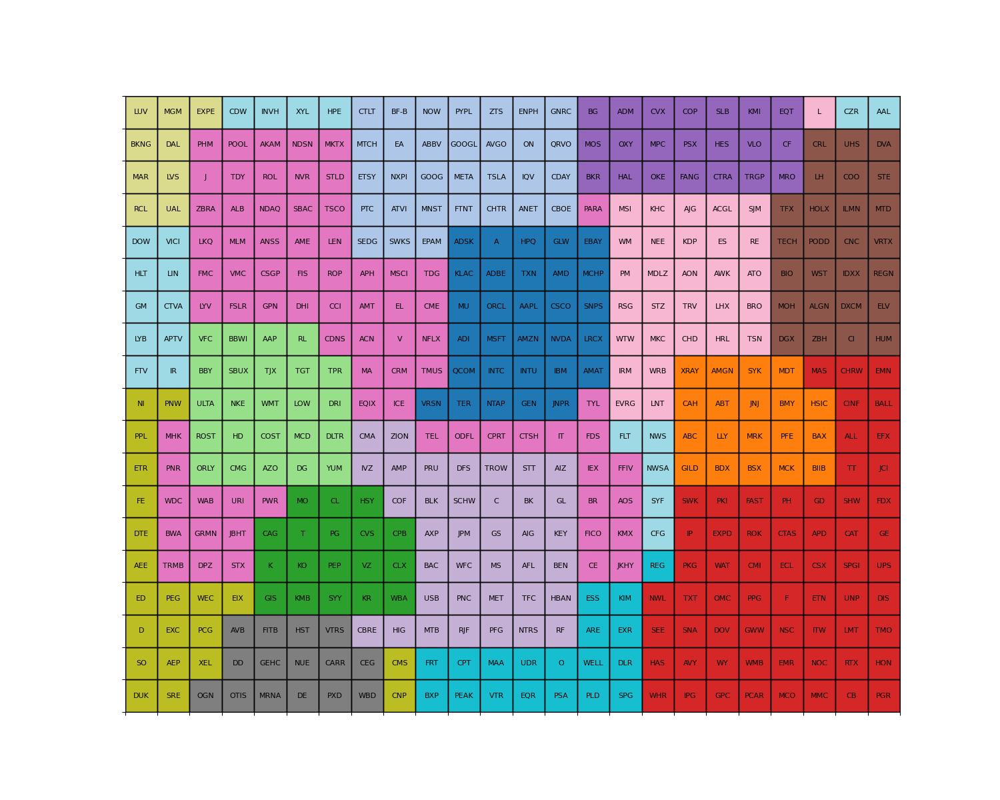

In [23]:
# NOTE: This is different from the actual best grid because we used a small number of iterations for the demo
plot_grid(best_grid, sorted_cluster_df)

## S&P 500 Simulator

This is the main and fun part of the project.
Using the previous grid, we build a cellular automata simulator.
The state transition function is based on LSTM models trained on the historical stock data.

### LSTM Model

Long Short-Term Memory (LSTM) models are a type of recurrent neural network (RNN) architecture that are specifically designed to overcome the limitations of traditional RNNs when handling long-range dependencies in time series data. They achieve this by introducing a memory cell and gating mechanisms (input, forget, and output gates) that allow the network to learn when to store, modify, or retrieve information from the memory cell.

In the context of this project, an LSTM model is an ideal choice because it aims to simulate the S&P 500 using LSTM models trained on real historical data for state transitions. The S&P 500 index consists of stocks that exhibit complex temporal dependencies and patterns, which LSTM models can effectively capture.

#### Design Choices

The `LSTMModel` class provided is a custom implementation of an LSTM model using the PyTorch library. The constructor takes the following parameters:

- `input_size`: The number of features in the input data. In this case, it is set to 1 since the input is the historical price of a single stock.
- `hidden_size`: The number of features in the hidden state. A larger hidden size can increase the model's capacity but may also increase the risk of overfitting.
- `num_layers`: The number of recurrent layers in the model. Stacking more layers can potentially help the model learn more complex patterns, but it also increases the model's complexity and may require more training data.
- `output_size`: The number of features in the output. Since the model is predicting the next day's percentage change, the output size is set to 1.

The `forward` method is responsible for the forward pass of the LSTM model. It takes an input tensor x of shape (`batch_size`, `seq_len`, `input_size`) and passes it through the LSTM layer, followed by a fully connected (linear) layer. The LSTM layer processes the input data and returns the hidden states for each time step. The fully connected layer maps the last hidden state to the desired output size. The output tensor has a shape of (batch_size, output_size).

The `predict` method is a utility function that takes a MinMaxScaler (used to scale the input data) and an input sequence of shape (seq_len, 1). It first scales the input sequence using the provided scaler, reshapes it to match the input shape expected by the model, and converts it to a PyTorch tensor. The method then calls the forward function to obtain the output, detaches it from the computation graph, converts it back to a NumPy array, and finally, inverses the scaling using the provided scaler. The method returns the predicted percentage change for the next day as a single float value.

In summary, the `LSTMModel` is a simple yet effective implementation of an LSTM model suitable for modeling the S&P 500 index's state transitions. The model's architecture is designed to capture the temporal dependencies in the historical data and make accurate predictions about the next day's percentage change. The choice of LSTM models is justified by their ability to handle long-range dependencies in time series data, which is essential for accurately simulating the S&P 500 index's behavior.

#### Training

Training the model on 5 consecutive day sequences is a design choice that allows the LSTM model to capture the short-term dependencies and patterns in the stock price movements. By looking at a 5-day window, the model can learn how the stock prices change within a week, which can be a useful period for modeling since stock markets have daily and weekly patterns. This time frame is a balance between considering too much historical data, which may not be relevant for short-term prediction, and too little data, which may not capture meaningful patterns.

To train the model, historical stock price data is first divided into sequences of 5 consecutive days. Each sequence's first 4 days are used as input features, and the 5th day is used as the target label. The LSTM model is then trained to learn the relationship between the input sequences and the corresponding target labels.

#### Prediction using Cellular Automata

For prediction, the LSTM model uses the real previous 4-day history of a stock and its 5th-day performance as input. To simulate the 5th-day performance for other stocks around the given stock, a cellular automata approach is used.

Cellular automata are discrete models that consist of a grid of cells, where each cell can have a finite number of states. The state of each cell evolves over time based on the states of its neighboring cells and a set of predefined transition rules. In this case, the grid represents the stocks, and the states are the stock prices or percentage changes.

To model the 5th-day performance for the neighboring stocks, the following steps are performed:

1. For each neighboring stock, gather its real previous 4-day history.
2. Apply the cellular automata transition rules to determine the state of the neighboring stocks on the 5th day. These rules can incorporate information from the given stock's 5th-day performance as well as the historical data of the neighboring stocks.
3. Use the LSTM model to predict the 5th-day performance for each neighboring stock using their updated 4-day history and the cellular automata-derived 5th-day state.

By combining the LSTM model with cellular automata, the prediction process can leverage both the learned temporal dependencies from the historical data and the spatial relationships between neighboring stocks. This approach aims to provide a more accurate simulation of the S&P 500 index's state transitions and stock price movements.


In [24]:
import numpy as np
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler

In [25]:
class LSTMModel(nn.Module):
    def __init__(self, input_size=1, hidden_size=32, num_layers=1, output_size=1):
        super(LSTMModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size)
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

    def predict(self, scaler: MinMaxScaler, input_seq: np.ndarray) -> float:
        input_seq = scaler.transform(input_seq)
        input_seq = input_seq.reshape(1, -1, 1)
        input_tensor = torch.tensor(input_seq, dtype=torch.float32)
        output = self.forward(input_tensor)
        output = output.detach().numpy().reshape(-1, 1)
        return scaler.inverse_transform(output)[0][0]

The `predict_neighbors` function is responsible for performing a single iteration of state transitions inside the cellular automata. Given a grid, a stock symbol, and an input sequence, the function finds the position of the stock symbol in the grid, identifies its immediate neighbors, and predicts the stock price change for each neighboring stock using the pre-trained LSTM models.

The `predict_neighbors` function essentially models the state transitions in the cellular automata. It uses the LSTM models to capture the stock price dynamics of each pair of neighboring stocks and predicts their future states based on their historical data and the input sequence.

In [26]:
from train import load_model_and_scaler
from simulator import find_stock_position, get_plus_neighbors

In [27]:
def predict_neighbors(grid: pd.DataFrame, stock_symbol: str, input_seq: np.ndarray) -> dict[str, float]:
    row, col = find_stock_position(grid, stock_symbol)
    neighbors = get_plus_neighbors(grid, row, col)
    predictions = {}

    for neighbor_row, neighbor_col in neighbors:
        neighbor_stock_symbol = grid.iat[neighbor_row, neighbor_col]
        model, scaler = load_model_and_scaler(f"model_A_{stock_symbol}-{neighbor_stock_symbol}")
        prediction = model.predict(scaler, input_seq)
        predictions[neighbor_stock_symbol] = prediction

    return predictions

The `simulate` function combines the `predict_neighbors` function with breadth-first search (BFS) to simulate the entire cellular automata. BFS is used to systematically traverse the grid, ensuring that all cells are visited and updated in the correct order.

The function initializes a queue for BFS, where each element in the queue contains a stock symbol, its input sequence, and the previous neighboring stock symbol. It maintains a set of visited cells and updated cells for each iteration.

While there are elements in the queue, the function dequeues the next element and processes it. It finds the position of the current stock symbol in the grid, identifies its neighbors, and updates their states using the `predict_neighbors` function. If a neighboring stock has not been visited yet, it's added to the queue with its updated input sequence. The function also keeps track of the visited cells and the cells that have been updated in the current iteration.

This process continues until all cells in the grid have been visited, and the simulation output is returned as a list of dictionaries, where each dictionary contains the stock symbols and their corresponding predicted price changes for a specific step in the simulation.

By using BFS in conjunction with the `predict_neighbors` function, the `simulate` function can effectively model the entire cellular automata and capture the complex interactions between the stocks in the grid. This approach allows the simulation to leverage the learned temporal dependencies from the LSTM models and the spatial relationships between neighboring stocks, providing a comprehensive view of the stock market dynamics.

In [28]:
from simulator import get_trailing_stock_data
from tqdm import tqdm

In [29]:
def simulate(grid: pd.DataFrame, stock_symbol: str, input_seq: np.ndarray) -> list[dict[str, float]]:
    # Initialize the output list
    simulation_output = []

    # Initialize the predictions dictionary with the input stock_symbol
    predictions = {stock_symbol: input_seq[-1][0]}

    # Initialize queue for BFS
    queue = [(stock_symbol, input_seq, None)]

    # Store the visited cells and the cells that have been updated in the current iteration
    visited = set()
    updated = set()

    # Wrap the while loop with tqdm to show progress
    with tqdm(total=grid.size, desc="Simulating") as pbar:
        while queue:
            current_symbol, current_input_seq, prev_neighbor_symbol = queue.pop(0)
            if current_symbol not in visited:
                visited.add(current_symbol)
                row, col = find_stock_position(grid, current_symbol)
                neighbors = get_plus_neighbors(grid, row, col)

                # Iterate through the neighbors
                for neighbor_row, neighbor_col in neighbors:
                    neighbor_stock_symbol = grid.iat[neighbor_row, neighbor_col]

                    # Skip the input stock_symbol when processing neighbors
                    if neighbor_stock_symbol == stock_symbol:
                        continue

                    # Load model and scaler for the current symbol and neighbor
                    model, scaler = load_model_and_scaler(f"model_A_{current_symbol}-{neighbor_stock_symbol}")

                    # Predict the value for the current neighbor
                    prediction = model.predict(scaler, current_input_seq)

                    # If this neighbor has already been predicted by another neighbor in the same iteration,
                    # calculate the average
                    if neighbor_stock_symbol in updated:
                        predictions[neighbor_stock_symbol] = (predictions[neighbor_stock_symbol] + prediction) / 2
                    else:
                        predictions[neighbor_stock_symbol] = prediction
                        updated.add(neighbor_stock_symbol)

                    # Add the predictions to the simulation_output
                    simulation_output.append(predictions.copy())

                    # If the neighbor has not been visited yet, add it to the queue
                    if neighbor_stock_symbol not in visited:
                        next_input_seq = get_trailing_stock_data(neighbor_stock_symbol, prediction)
                        queue.append((neighbor_stock_symbol, next_input_seq, current_symbol))

                # Update the progress bar
                pbar.update(1)

    return simulation_output

## Interactive Demo

Update the `ticker` symbol and `change` amount in the code below to simulate the S&P 500 index's state transitions and stock price movements.

In [30]:
ticker = "AAPL"
change = 0.5

> Do not change the code below

In [31]:
from simulator import get_trailing_stock_data, load_grid, plot_simulation

Simulating: 100%|██████████| 500/500 [00:07<00:00, 63.42it/s]

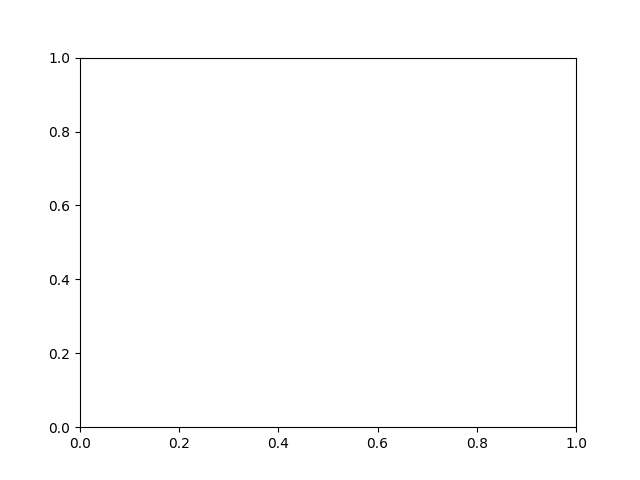

In [32]:
grid = load_grid()

# Get the input sequence
input_seq = get_trailing_stock_data(ticker, change)

# Simulate all the cells in the grid
simulations = simulate(grid, ticker, input_seq)

# Plot the animation of the simulations
anim = plot_simulation(grid, simulations)
plt.show()